
# Using the Decision Transformer model with 🤗 Transformers



## Installing dependencies
We first need to install the required dependencies in order to run a Mujoco environment inside a Colab notebook




In [1]:
# Note: you need to install this packages on your machine separately through the terminal

#!apt-get install -y \
#    libgl1-mesa-dev \
#    libgl1-mesa-glx \
#    libglew-dev \
#    libosmesa6-dev \
#    software-properties-common \
#    patchelf \
#    xvfb

## Installing Pip packages
We also require the following pip packages:

In [2]:
#!pip3 install setuptools==65.5.0
#!pip install gym==0.21.0
#!pip install --upgrade setuptools

In [3]:
import gym

In [4]:
#!pip install ffmpeg

In [5]:
# Added by Andrew Feldman
#!pip install gym==0.21.0

#!pip install gym==0.21.0
#!pip uninstall -y free-mujoco-py
!pip install free-mujoco-py
!pip install git+https://github.com/huggingface/transformers # This change is not part of the pip package, yet.

!pip install colabgymrender==1.0.2
!pip install xvfbwrapper
!pip install imageio==2.4.1

!pip uninstall -y free-mujoco-py
!pip install free-mujoco-py

## Importing the packages


In [6]:
import torch
import mujoco_py
import gym
import numpy as np

from colabgymrender.recorder import Recorder
from transformers import DecisionTransformerModel

## Defining a function that performs masked autoregressive predictive of actions.

The model's prediction is conditioned on sequences of states, actions, time-steps and returns. The action for the current time-step is included as zeros and masked in to not skew the model's attention distribution.

In [7]:
# Function that gets an action from the model using autoregressive prediction with a window of the previous 20 timesteps.
def get_action(model, states, actions, rewards, returns_to_go, timesteps):
    # This implementation does not condition on past rewards

    states = states.reshape(1, -1, model.config.state_dim)
    actions = actions.reshape(1, -1, model.config.act_dim)
    returns_to_go = returns_to_go.reshape(1, -1, 1)
    timesteps = timesteps.reshape(1, -1)

    states = states[:, -model.config.max_length :]
    actions = actions[:, -model.config.max_length :]
    returns_to_go = returns_to_go[:, -model.config.max_length :]
    timesteps = timesteps[:, -model.config.max_length :]
    padding = model.config.max_length - states.shape[1]
    # pad all tokens to sequence length
    attention_mask = torch.cat([torch.zeros(padding), torch.ones(states.shape[1])])
    attention_mask = attention_mask.to(dtype=torch.long).reshape(1, -1)
    states = torch.cat([torch.zeros((1, padding, model.config.state_dim)), states], dim=1).float()
    actions = torch.cat([torch.zeros((1, padding, model.config.act_dim)), actions], dim=1).float()
    returns_to_go = torch.cat([torch.zeros((1, padding, 1)), returns_to_go], dim=1).float()
    timesteps = torch.cat([torch.zeros((1, padding), dtype=torch.long), timesteps], dim=1)

    state_preds, action_preds, return_preds = model(
        states=states,
        actions=actions,
        rewards=rewards,
        returns_to_go=returns_to_go,
        timesteps=timesteps,
        attention_mask=attention_mask,
        return_dict=False,
    )

    return action_preds[0, -1]

In [8]:
# build the environment
directory = './video'

env = gym.make("Hopper-v3")
env = Recorder(env, directory, fps=fps)
max_ep_len = 1000
device = "cpu"
scale = 1000.0  # normalization for rewards/returns
TARGET_RETURN = 3600 / scale  # evaluation is conditioned on a return of 3600, scaled accordingly
# mean and std computed from training dataset these are available in the model card for each model.
state_mean = np.array(
    [1.3490015,  -0.11208222, -0.5506444,  -0.13188992, -0.00378754,  2.6071432,
     0.02322114, -0.01626922, -0.06840388, -0.05183131,  0.04272673,]
)
state_std = np.array(
    [0.15980862, 0.0446214,  0.14307782, 0.17629202, 0.5912333,  0.5899924,
 1.5405099,  0.8152689,  2.0173461,  2.4107876,  5.8440027,]
)
state_dim = env.observation_space.shape[0]
act_dim = env.action_space.shape[0]
# Create the decision transformer model
model = DecisionTransformerModel.from_pretrained("edbeeching/decision-transformer-gym-hopper-expert")
model = model.to(device)
print(list(model.encoder.wpe.parameters()))

state_mean = torch.from_numpy(state_mean).to(device=device)
state_std = torch.from_numpy(state_std).to(device=device)

[Parameter containing:
tensor([[-0., -0., 0.,  ..., 0., 0., 0.],
        [0., -0., -0.,  ..., 0., 0., -0.],
        [-0., 0., -0.,  ..., 0., 0., -0.],
        ...,
        [0., -0., -0.,  ..., 0., 0., 0.],
        [0., -0., 0.,  ..., 0., 0., 0.],
        [0., -0., 0.,  ..., 0., 0., -0.]], requires_grad=True)]


In [9]:
# Interact with the environment and create a video
episode_return, episode_length = 0, 0
state = env.reset()
target_return = torch.tensor(TARGET_RETURN, device=device, dtype=torch.float32).reshape(1, 1)
states = torch.from_numpy(state).reshape(1, state_dim).to(device=device, dtype=torch.float32)
actions = torch.zeros((0, act_dim), device=device, dtype=torch.float32)
rewards = torch.zeros(0, device=device, dtype=torch.float32)

timesteps = torch.tensor(0, device=device, dtype=torch.long).reshape(1, 1)
for t in range(max_ep_len):
    actions = torch.cat([actions, torch.zeros((1, act_dim), device=device)], dim=0)
    rewards = torch.cat([rewards, torch.zeros(1, device=device)])

    action = get_action(
        model,
        (states - state_mean) / state_std,
        actions,
        rewards,
        target_return,
        timesteps,
    )
    actions[-1] = action
    action = action.detach().cpu().numpy()

    state, reward, done, _ = env.step(action)

    cur_state = torch.from_numpy(state).to(device=device).reshape(1, state_dim)
    states = torch.cat([states, cur_state], dim=0)
    rewards[-1] = reward

    pred_return = target_return[0, -1] - (reward / scale)
    target_return = torch.cat([target_return, pred_return.reshape(1, 1)], dim=1)
    timesteps = torch.cat([timesteps, torch.ones((1, 1), device=device, dtype=torch.long) * (t + 1)], dim=1)

    episode_return += reward
    episode_length += 1

    if done:
        break


OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


In [14]:
print(actions.shape)

torch.Size([1000, 3])


In [26]:
fps=30
max_freq=2

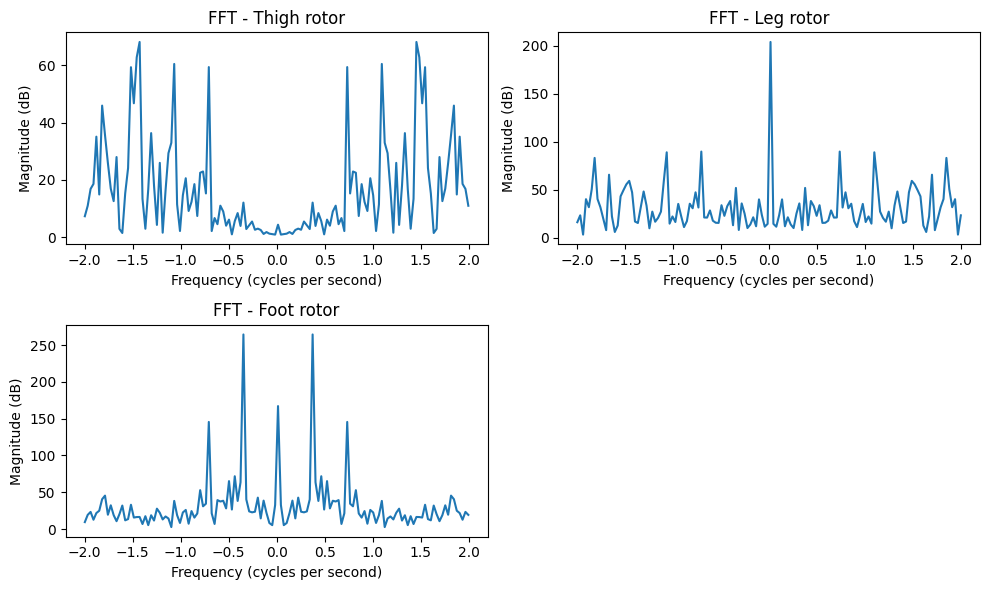

In [32]:
fps=30
max_freq=2

import math
import matplotlib.pyplot as plt

import torch
import numpy as np
import matplotlib.pyplot as plt
import math

# Suppose actions tensor exists with shape torch.Size([1000, act_dim])
# actions = torch.rand([1000, act_dim])

# Suppose fps and max_freq are given
# fps = ...
# max_freq = ...

# Calculate the frequency axis (cycles per second)
freq = np.linspace(-0.5 * fps, 0.5 * fps, actions.size(0))

# Get indices of frequency within the required range
indices = np.where(np.abs(freq) <= max_freq)

# Get the action dimension
act_dim = actions.shape[1]

# Calculate number of subplots required based on act_dim
nrows = math.ceil(act_dim / 2)  # 2 columns layout
ncols = 2 if act_dim > 1 else 1

fig, axs = plt.subplots(nrows, ncols, figsize=(10, act_dim * 2))  # adjusting figure size based on act_dim
axs = axs.flatten()  # To handle the case of one subplot (act_dim=1)

for i in range(act_dim):
    # Perform the FFT
    fft_result = torch.fft.fft(actions[:, i])

    # Shift the FFT result for better visualization
    fft_result_shifted = torch.fft.fftshift(fft_result)

    # Compute the magnitude in dB
    magnitude = torch.abs(fft_result_shifted)#20 * torch.log10(torch.abs(fft_result_shifted))

    # Plot the result with frequency in cycles per second
    axs[i].plot(freq[indices], magnitude.detach().numpy()[indices])
    if i==0:
        axs[i].set_title(f'FFT - Thigh rotor')
    elif i==1:
        axs[i].set_title(f'FFT - Leg rotor')
    elif i==2:
        axs[i].set_title(f'FFT - Foot rotor')
        
    axs[i].set_xlabel('Frequency (cycles per second)')
    axs[i].set_ylabel('Magnitude (dB)')

# Delete any unused subplots when act_dim is odd
if act_dim % 2 != 0:
    fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()


In [43]:
states.shape

torch.Size([1001, 11])

In [37]:
state_dim

11

In [40]:
states[0,0]

tensor(1.2549, dtype=torch.float64)

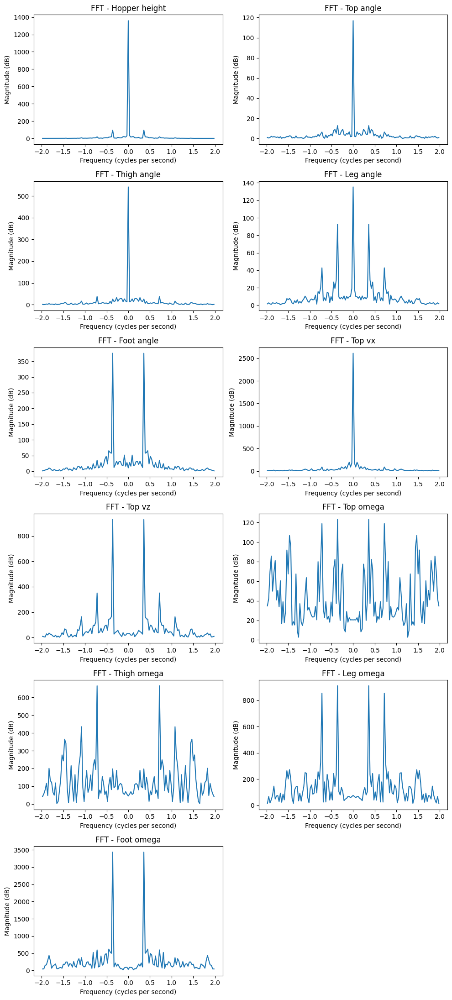

In [47]:
fps=30
max_freq=2

# Calculate the frequency axis (cycles per second)
freq = np.linspace(-0.5 * fps, 0.5 * fps, states.size(0))

# Get indices of frequency within the required range
indices = np.where(np.abs(freq) <= max_freq)

# Get the dimension from states
dim = states.shape[1]

# Calculate number of subplots required based on dim
nrows = math.ceil(dim / 2)  # 2 columns layout
ncols = 2 if dim > 1 else 1

fig, axs = plt.subplots(nrows, ncols, figsize=(10, dim * 2))  # adjusting figure size based on dim
axs = axs.flatten()  # To handle the case of one subplot (dim=1)

state_names=["Hopper height","Top angle","Thigh angle","Leg angle","Foot angle","Top vx","Top vz","Top omega","Thigh omega","Leg omega","Foot omega"]

for i in range(state_dim):
    #print(i)
    # Perform the FFT
    fft_result = torch.fft.fft(states[:, i])

    # Shift the FFT result for better visualization
    fft_result_shifted = torch.fft.fftshift(fft_result)

    # Compute the magnitude in dB
    magnitude = torch.abs(fft_result_shifted) #20 * torch.log10(torch.abs(fft_result_shifted))


    
    # Plot the result with frequency in cycles per second
    axs[i].plot(freq[indices], magnitude.detach().numpy()[indices])
    axs[i].set_title(f'FFT - {state_names[i]}')
    axs[i].set_xlabel('Frequency (cycles per second)')
    axs[i].set_ylabel('Magnitude (dB)')

# Delete any unused subplots when dim is odd
if dim % 2 != 0:
    fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()

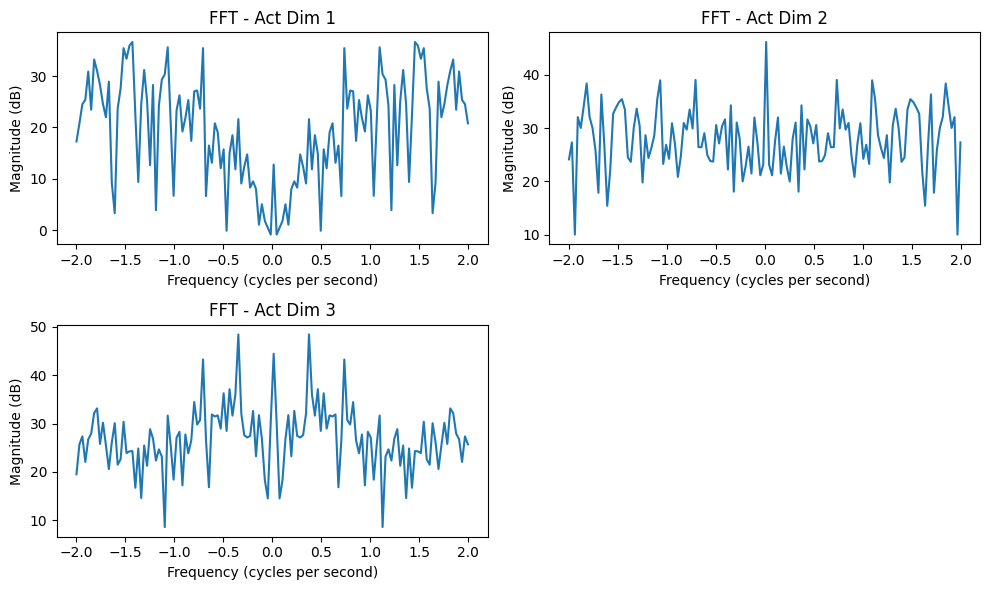

In [29]:
import math
import matplotlib.pyplot as plt

import torch
import numpy as np
import matplotlib.pyplot as plt
import math

# Suppose actions tensor exists with shape torch.Size([1000, act_dim])
# actions = torch.rand([1000, act_dim])

# Suppose fps and max_freq are given
# fps = ...
# max_freq = ...

# Calculate the frequency axis (cycles per second)
freq = np.linspace(-0.5 * fps, 0.5 * fps, actions.size(0))

# Get indices of frequency within the required range
indices = np.where(np.abs(freq) <= max_freq)

# Get the action dimension
act_dim = actions.shape[1]

# Calculate number of subplots required based on act_dim
nrows = math.ceil(act_dim / 2)  # 2 columns layout
ncols = 2 if act_dim > 1 else 1

fig, axs = plt.subplots(nrows, ncols, figsize=(10, act_dim * 2))  # adjusting figure size based on act_dim
axs = axs.flatten()  # To handle the case of one subplot (act_dim=1)

for i in range(act_dim):
    # Perform the FFT
    fft_result = torch.fft.fft(actions[:, i])

    # Shift the FFT result for better visualization
    fft_result_shifted = torch.fft.fftshift(fft_result)

    # Compute the magnitude in dB
    magnitude = 20 * torch.log10(torch.abs(fft_result_shifted))

    # Plot the result with frequency in cycles per second
    axs[i].plot(freq[indices], magnitude.detach().numpy()[indices])
    axs[i].set_title(f'FFT - Act Dim {i+1}')
    axs[i].set_xlabel('Frequency (cycles per second)')
    axs[i].set_ylabel('Magnitude (dB)')

# Delete any unused subplots when act_dim is odd
if act_dim % 2 != 0:
    fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()

In [10]:
# Play the video
env.play()
# If you want to convert the video:
# !ffmpeg -i {your_video} -vcodec h264 replay.mp4

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [31]:
!ffmpeg -i video/1689552545.8128128.mp4 -vcodec h264 replay.mp4

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e